In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

In [2]:
#import dataset
df = pd.read_csv('application_train.csv')
df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


In [4]:
#check NA value
df.isna().sum()

SK_ID_CURR                        0
TARGET                            0
NAME_CONTRACT_TYPE                0
CODE_GENDER                       0
FLAG_OWN_CAR                      0
                              ...  
AMT_REQ_CREDIT_BUREAU_DAY     41519
AMT_REQ_CREDIT_BUREAU_WEEK    41519
AMT_REQ_CREDIT_BUREAU_MON     41519
AMT_REQ_CREDIT_BUREAU_QRT     41519
AMT_REQ_CREDIT_BUREAU_YEAR    41519
Length: 122, dtype: int64

### 1. Untuk feature/column AMT_INCOME_TOTAL & AMT_CREDIT, hitung dan beri insight terkait :
* Central Tendency
* Dispersion
* Distribution

In [5]:
#create function for central tendency
def central_tendency(df,var):
    print(var + ' mean :', df[var].mean())
    print(var + ' median :', df[var].median())
    print(var + ' mode :', df[var].mode()[0])

#create function for dispersion
def dispersion(df,var):
    print(var + ' Range:', df[var].max()-df[var].min())
    print('')
    print(var + ' Std:', df[var].std())
    print('')
    print(var + ' Quartile:\n'+str(df[var].quantile([0.25,0.5,0.75,1])))
    print('')
    print(var + ' IQR:', df[var].quantile(0.75)-df[var].quantile(0.25))

#create function for distribution plot
def dist_plot(df, var, bin) :
    plt.style.use('seaborn')
    fig, (ax1,ax2) = plt.subplots(2,figsize=(8,6), sharex=True)
    fig.suptitle(var +' Distribution', size=15,fontweight='bold')

    #calculate mean, median, mode
    mean = df[var].mean()
    med = df[var].median()
    mode = df[var].mode()[0]

    #create boxplot
    sns.boxplot(x=df[var], ax=ax1)
    ax1.set_xlabel('')

    #create histogram
    sns.histplot(x=df[var], bins=bin, kde=True, ax=ax2)   
    ax2.set_xlabel(var)
    ax2.set_ylabel('Frequency')
     #add vertical line histogram
    ax2.axvline(mean, color = 'b', linestyle='dashed',label='Mean :'+str(round(mean,2)))
    ax2.axvline(med, color = 'k', linestyle='dashdot',label='Median :'+str(round(med,2)))
    ax2.axvline(mode, color = 'c', linestyle='dotted',label='Mode :'+str(round(mode,2)))
    ax2.legend(loc='upper right')
    
    plt.show()
    


1. AMT_INCOME_TOTAL (central tendency, dispersion, distribution)

In [6]:
#central tendency
central_tendency(df,'AMT_INCOME_TOTAL')

AMT_INCOME_TOTAL mean : 168797.9192969845
AMT_INCOME_TOTAL median : 147150.0
AMT_INCOME_TOTAL mode : 135000.0


In [7]:
#dispersion
dispersion(df,'AMT_INCOME_TOTAL')

AMT_INCOME_TOTAL Range: 116974350.0

AMT_INCOME_TOTAL Std: 237123.14627885626

AMT_INCOME_TOTAL Quartile:
0.25       112500.0
0.50       147150.0
0.75       202500.0
1.00    117000000.0
Name: AMT_INCOME_TOTAL, dtype: float64

AMT_INCOME_TOTAL IQR: 90000.0


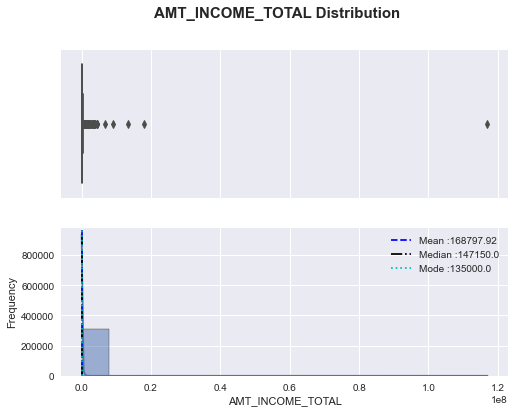

In [8]:
#distribution
dist_plot(df, 'AMT_INCOME_TOTAL', 15)

Dapat terlihat pada grafik histogram di atas, bahwa variable amount income total berdistribusi right skewed dengan sebaran income lebih banyak berada pada kisaran 25000- 10000000 dengan frekuensi di atas 300000, yang mengindikasikan bahwa mayoritas applicant pinjaman memiliki income rendah.
Terdapat pula satu data amount dengan nominal yang sangat besar, 117000000 yang kemungkinannya salah input

2. AMT_CREDIT (central tendency, dispersion, distribution)

In [9]:
#central tendency
central_tendency(df,'AMT_CREDIT')

AMT_CREDIT mean : 599025.9997057016
AMT_CREDIT median : 513531.0
AMT_CREDIT mode : 450000.0


In [10]:
#dispersion
dispersion(df,'AMT_CREDIT')

AMT_CREDIT Range: 4005000.0

AMT_CREDIT Std: 402490.77699585486

AMT_CREDIT Quartile:
0.25     270000.0
0.50     513531.0
0.75     808650.0
1.00    4050000.0
Name: AMT_CREDIT, dtype: float64

AMT_CREDIT IQR: 538650.0


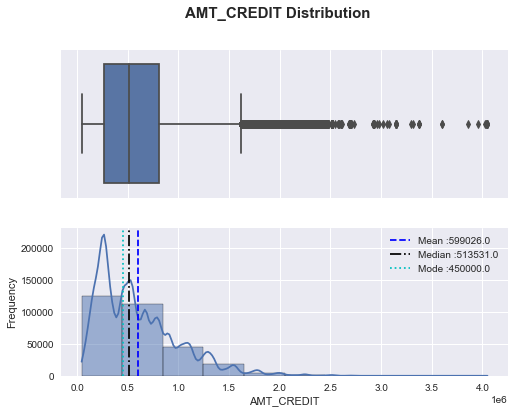

In [11]:
#distribution
dist_plot(df, 'AMT_CREDIT', 10)

Dapat dilihat pada grafik diatas bahwa distribusi variabel amount credit adalah right skewed, dengan iqr berada pada range 270000 dan 808650, yang mengindikasikan mayoritas nominal credit memiliki jumlah yang kecil

### 2. Carilah data outlier dalam bentuk plot yang tepat untuk feature DAYS_EMPLOYED. Jelaskan insightnya

In [12]:
#finding outlier on Distance
def outlier_calc(df, var):

    #calculate q1,q3,iqr,lower & upper whisker
    q3 = df[var].quantile(0.75)
    q1 = df[var].quantile(0.25)
    iqr = q3 - q1
    low_whisker = q1 - 1.5*iqr
    upp_whisker = q3 + 1.5*iqr
    return q1,q3,iqr,low_whisker, upp_whisker

def outlier_plot(df, var):
    #boxplot
    sns.boxplot(x=df[var]) 
    plt.title(var + ' Boxplot', size=15, fontweight='bold')
    plt.xlabel(var)
    #calculation labels on top right
    plt.annotate('Q1 : '+str(round(q1,2))
                +'\nQ3 : '+str(round(q3,2))
                +'\nIQR : '+str(round(iqr,2))
                +'\nLower Whisker : '+str(round(low_whisker,2))
                +'\nUpper Whisker : '+str(round(upp_whisker,2)),
                xy=(320,290), xycoords='axes points', ha='left', va='top')
    plt.show()



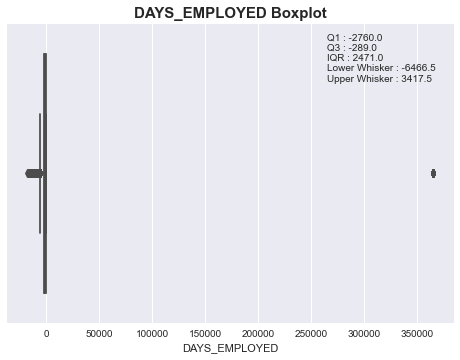

In [13]:
q1,q3,iqr,low_whisker, upp_whisker = outlier_calc(df,'DAYS_EMPLOYED')
outlier_plot(df,'DAYS_EMPLOYED')

In [14]:
outlier_data = df.DAYS_EMPLOYED[(df.DAYS_EMPLOYED < low_whisker) | (df.DAYS_EMPLOYED > upp_whisker)]
outlier_data

8         365243
11        365243
18         -7804
23        365243
38        365243
           ...  
307502     -8736
307504     -7258
307505    365243
307507    365243
307508     -7921
Name: DAYS_EMPLOYED, Length: 72217, dtype: int64

Berdasarkan figur di atas dapat terlihat bahwa sebaran data untuk variable DAYS_EMPLOYED mayoritas berada pada rentang -2760 hingga -289 hari, yang merupakan selisih tanggal aplikasi peminjaman - tanggal mulai bekerja (minus mengindikasikan applicant memiliki pekerjaan). Data outlier ditemukan sebanyak 72217 data diluar lower dan upper whiskernya. Namun, mayoritas data outlier merupakan data sebesar 365243 hari dengan jumlah 55374 yang perlu digali lebih dalam apakah data tersebut salah input atau ada asumsi tertentu yang digunakan untuk mengisi data.

### 3. Tampilkan distribusi dalam bentuk plot yang tepat untuk kolom DAYS_BIRTH. Jelaskan insightnya

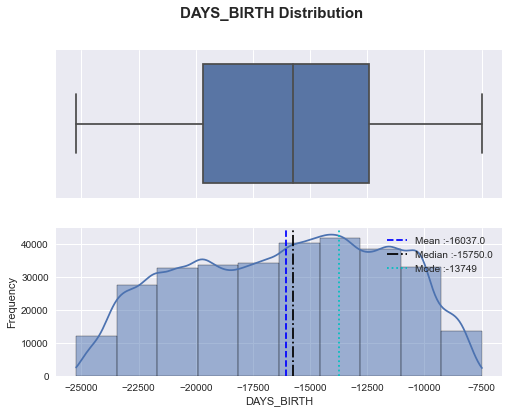

In [15]:
dist_plot(df,'DAYS_BIRTH', 10)

Berdasarkan figur diatas, dapat dilihat bahwa variabel DAYS_BIRTH cenderung berdistribusi left skewed sedikit, namun sudah dapat diasumsikan normal. Mayoritas data berada pada rentang -20000 hingga -12500. Data merupakan selisih dari tanggal aplikasi peminjaman dikurangi dengan tanggal lahir. Untuk proses data selanjutnya, data negatif ini perlu untuk di positifkan sehingga dapat lebih menggambarkan variabel DAYS_BIRTH

### 4. Buat plot untuk kelompok yang tepat untuk kelompok umur yang gagal melakukan pembayaran.

In [16]:
#subset dataframe
df_age_group = df[['TARGET', 'DAYS_BIRTH']]
#convert to positive and year
df_age_group['YEARS_BIRTH'] = df_age_group['DAYS_BIRTH'] * -1 / 365 
#create categorical age group
bins= [20,26,31,36,41,46,51,56,61,66,71]
labels = ['20-25 yrs','26-30 yrs','31-35 yrs','36-40 yrs','41-45 yrs','46-50 yrs','51-55 yrs','56-60 yrs','61-65 yrs','66-70 yrs']
df_age_group['AGE_GROUP'] = pd.cut(df_age_group['YEARS_BIRTH'], bins=bins, labels=labels)
#filter target untuk yang gagal melakukan pembayaran (Target =0)
df_age_group_target0 =  df_age_group[df_age_group.TARGET == 0]
df_age_group_target0.head()

<ipython-input-16-ccfdebf1020b>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_age_group['YEARS_BIRTH'] = df_age_group['DAYS_BIRTH'] * -1 / 365
<ipython-input-16-ccfdebf1020b>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_age_group['AGE_GROUP'] = pd.cut(df_age_group['YEARS_BIRTH'], bins=bins, labels=labels)


,TARGET,DAYS_BIRTH,YEARS_BIRTH,AGE_GROUP
1,0,-16765,45.931507,41-45 yrs
2,0,-19046,52.180822,51-55 yrs
3,0,-19005,52.068493,51-55 yrs
4,0,-19932,54.608219,51-55 yrs
5,0,-16941,46.413699,46-50 yrs


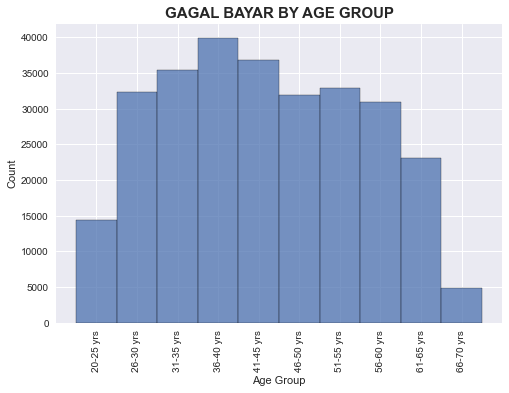

In [17]:
#Create Barplot untuk yang gagal melakukan pembayaran
plt.style.use('seaborn')
sns.histplot(x='AGE_GROUP', data=df_age_group_target0)
plt.xticks(rotation=90)
plt.title('GAGAL BAYAR BY AGE GROUP', size=15, fontweight='bold')
plt.xlabel('Age Group')
plt.show()



Berdasarkan histogram di atas, kelompok umur yang paling banyak gagal membayar adalah pada usia 31-35 tahun. Mayoritas peminjam berada pada rentang 26 - 65 tahun. Dengan cukup sedikit peminjam berada di rentang usia 20-25 tahun dan 66-70 tahun. Namun, akan lebih baik jika melihat dari nilai ratio gagal bayar yang dihitung dari jumlah pengajuan dibagi dengan jumlah yang gagal bayar, sehingga dapat dipastikan resiko gagal bayar terletak pada kelompok usia yang mana

### 5. Di antara NAME_INCOME_TYPE, DAYS_BIRTH, & REGION_RATING_CLIENT_W_CITY, , manakah feature/column yang memiliki nilai korelasi tinggi pada TARGET? Jelaskan metode korelasi yang digunakan serta insight untuk perusahaan

In [18]:
df_corr = df[['NAME_INCOME_TYPE', 'DAYS_BIRTH', 'REGION_RATING_CLIENT_W_CITY', 'TARGET']]
df_corr.head()

,NAME_INCOME_TYPE,DAYS_BIRTH,REGION_RATING_CLIENT_W_CITY,TARGET
0,Working,-9461,2,1
1,State servant,-16765,1,0
2,Working,-19046,2,0
3,Working,-19005,2,0
4,Working,-19932,2,0


In [22]:
# print(stats.normaltest(df.NAME_INCOME_TYPE))
print(stats.normaltest(df.DAYS_BIRTH))
print(stats.normaltest(df.REGION_RATING_CLIENT_W_CITY))
print(stats.normaltest(df.TARGET))

NormaltestResult(statistic=93796.73391873206, pvalue=0.0)
NormaltestResult(statistic=5573.840142566499, pvalue=0.0)
NormaltestResult(statistic=186567.46177536977, pvalue=0.0)


Dikarenakan p-valuenya dibawah 0.05, maka variable tersebut tidak berdistribusi normal sehingga menggunakan metode spearman

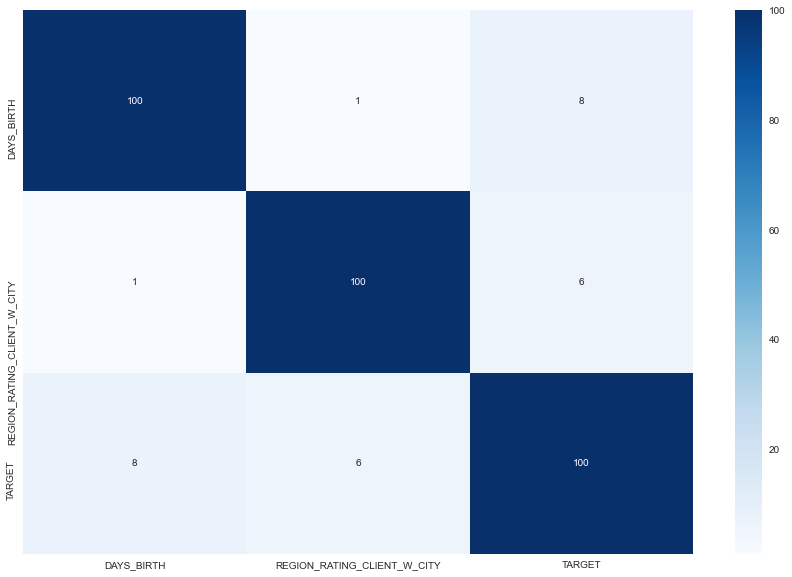

In [23]:
plt.figure(figsize=(15, 10))
corr = df_corr.corr(method = 'spearman')
sns.heatmap(corr*100, cmap="Blues", annot= True, fmt=".0f")
plt.show()

Berdasarkan perhitungan korelasi tersebut, dapat dilihat bahwa variable yang berkolerasi paling besar dengan TARGET adalah DAYS_BIRTH. Namun, keseluruhan variable mengindikasikan korelasi yang lemah terhadap target. Sehingga, apabila akan menentukan persetujuan kredit, dapat menganalisa variabel yang lain atau mengkombinasikannya.

### 6. Temukan NAME_INCOME_TYPE yang rata-rata income (AMT_INCOME_TOTAL) paling tinggi, serta tampilkan NAME_INCOME_TYPE dan rata-rata salary dalam bentuk Barplot! Lalu carilah:
* Tiga NAME_EDUCATION_TYPE yang memiliki rata-rata salary tertinggi!
* Lima tipe pekerjaan (OCCUPATION_TYPE) yang memiliki rata-rata salary tertinggi!
* Tiga status perkawinan (NAME_FAMILY_STATUS) yang paling sering dilakukan!


In [30]:
df_income_high = df[df.AMT_INCOME_TOTAL > df.AMT_INCOME_TOTAL.mean()]

In [40]:
df.AMT_INCOME_TOTAL.mean()

168797.9192969845

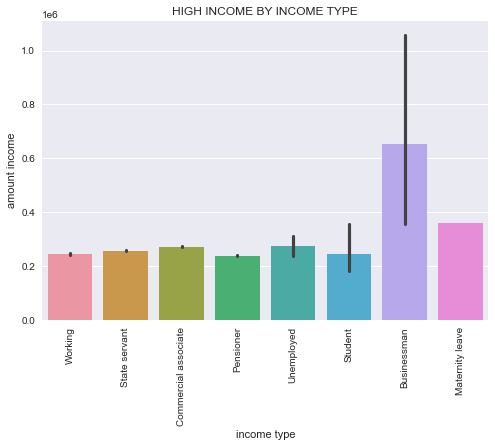

In [31]:
sns.barplot(x='NAME_INCOME_TYPE', y='AMT_INCOME_TOTAL', data=df_income_high)
plt.title('HIGH INCOME BY INCOME TYPE')
plt.xlabel('income type')
plt.xticks(rotation=90)
plt.ylabel('amount income')
plt.show()

Businessman memiliki income tertinggi dibanding dengan type income yang lainnya. Perusahaan dapat mengutamakan untuk approve pengajuan kredit dengan melihat type income ini, khususnya pada type Businessman

Tiga NAME_EDUCATION_TYPE yang memiliki rata-rata salary tertinggi!

In [32]:
df_income_high.groupby('NAME_EDUCATION_TYPE').mean().sort_values('AMT_INCOME_TOTAL',ascending=False)['AMT_INCOME_TOTAL'].head(3)


NAME_EDUCATION_TYPE
Academic degree      306467.307692
Higher education     277566.133069
Incomplete higher    254324.492426
Name: AMT_INCOME_TOTAL, dtype: float64

Lima tipe pekerjaan (OCCUPATION_TYPE) yang memiliki rata-rata salary tertinggi!

In [35]:
df_income_high.groupby('OCCUPATION_TYPE').mean().sort_values('AMT_INCOME_TOTAL',ascending=False)['AMT_INCOME_TOTAL'].head(5)

OCCUPATION_TYPE
Managers       311345.413195
IT staff       283533.369932
Accountants    263026.374503
HR staff       258348.404494
Secretaries    256851.334107
Name: AMT_INCOME_TOTAL, dtype: float64

Tiga status perkawinan (NAME_FAMILY_STATUS) yang paling sering dilakukan!

In [39]:
df_name_income_high.groupby('NAME_FAMILY_STATUS').count().sort_values('SK_ID_CURR',ascending=False)['SK_ID_CURR'].head(3)

NAME_FAMILY_STATUS
Married                 78973
Single / not married    17438
Civil marriage          11590
Name: SK_ID_CURR, dtype: int64